# Downloading Files

uses the following package(`import restapi`)

```python
pip install bmi-arcgis-restapi
```

In [1]:
# Change this value to the working folder for the script on your computer
folder = r"C:\Users\dane.parks\Downloads\scripting"

In [2]:
import restapi
import os
import time
from pathlib import Path

full_run_time_start = time.time()

url = "https://geo1.oit.ohio.gov/arcgis/rest/services/OGRIP/OSIPDownloads/MapServer"

# reference map service
mapService = restapi.MapService(url)

C:\Users\dane.parks\AppData\Local\anaconda3\envs\lab\lib\site-packages\restapi\common_types.py:42: UserWarning: No Arcpy found, some limitations in functionality may apply.
  warnings.warn('No Arcpy found, some limitations in functionality may apply.')
C:\Users\dane.parks\AppData\Local\anaconda3\envs\lab\lib\site-packages\restapi\rest_utils.py:42: UserWarning: no request client has been set, using default client
  warnings.warn('no request client has been set, using default client')


### Open Esri tool to determine bounding box you want to use, then copy the JSON info to the cell two down

In [3]:
restapi.open_geometry_helper()

In [4]:
bbox = restapi.Geometry(
{
  "spatialReference": {
    "wkid": 4326
  },
  "rings": [
    [
      [
        -81.58108520507939,
        41.415944954955904
      ],
      [
        -81.79188537597754,
        41.415944954955904
      ],
      [
        -81.79188537597754,
        41.534271781339065
      ],
      [
        -81.58108520507939,
        41.534271781339065
      ],
      [
        -81.58108520507939,
        41.415944954955904
      ]
    ]
  ]
}
)

In [5]:
# Have to check North (index 0) and South (index 1) tileservers
tiles = mapService.layer(0).select_by_location(bbox, exceed_limit=True)
tiles.features.extend(
    (mapService.layer(1).select_by_location(bbox, exceed_limit=True)).features
)

In [6]:
list_of_osip1_tiles = []

for tile in tiles:
    list_of_osip1_tiles.append(
        (tile["properties"]["TILE"], tile["properties"]["FOLDER"])
    )
    print((tile["properties"]["TILE"], tile["properties"]["FOLDER"]))

('N2160635', 'Cuyahoga')
('N2160640', 'Cuyahoga')
('N2160645', 'Cuyahoga')
('N2160650', 'Cuyahoga')
('N2160655', 'Cuyahoga')
('N2160660', 'Cuyahoga')
('N2160665', 'Cuyahoga')
('N2160670', 'Cuyahoga')
('N2165635', 'Cuyahoga')
('N2165640', 'Cuyahoga')
('N2165645', 'Cuyahoga')
('N2165650', 'Cuyahoga')
('N2165655', 'Cuyahoga')
('N2165660', 'Cuyahoga')
('N2165665', 'Cuyahoga')
('N2170635', 'Cuyahoga')
('N2170640', 'Cuyahoga')
('N2170645', 'Cuyahoga')
('N2170650', 'Cuyahoga')
('N2170655', 'Cuyahoga')
('N2170660', 'Cuyahoga')
('N2170665', 'Cuyahoga')
('N2175635', 'Cuyahoga')
('N2175640', 'Cuyahoga')
('N2175645', 'Cuyahoga')
('N2175650', 'Cuyahoga')
('N2175655', 'Cuyahoga')
('N2175660', 'Cuyahoga')
('N2175665', 'Cuyahoga')
('N2180635', 'Cuyahoga')
('N2180640', 'Cuyahoga')
('N2180645', 'Cuyahoga')
('N2180650', 'Cuyahoga')
('N2180655', 'Cuyahoga')
('N2180660', 'Cuyahoga')
('N2180665', 'Cuyahoga')
('N2180670', 'Cuyahoga')
('N2185635', 'Cuyahoga')
('N2185640', 'Cuyahoga')
('N2185645', 'Cuyahoga')


### Create folders for downloaded files

In [7]:
if not os.path.exists(Path(folder) / "SID"):
    os.mkdir(Path(folder) / "SID")
if not os.path.exists(Path(folder) / "LAS"):
    os.mkdir(Path(folder) / "LAS")

FileNotFoundError: [WinError 3] The system cannot find the path specified: 'C:\\Users\\dane.parks\\Downloads\\scripting\\SID'

# Async Method

In [8]:
import asyncio
import aiohttp


async def download_file(url, file_type):
    target_folder = Path(folder)

    async with aiohttp.ClientSession() as session:
        async with session.get(url) as response:
            filename = target_folder / file_type / (Path(url).stem + ".zip")

            with open(filename, mode="wb") as file:
                while True:
                    chunk = await response.content.read()
                    if not chunk:
                        break
                    file.write(chunk)
                print(f"Downloaded file {filename}")

In [9]:
async def download_sid_files():
    tasks = [
        download_file(
            f"https://gis1.oit.ohio.gov/ZIPARCHIVES/IMAGERY/1FTSIDTILES/{folder}/{tile}_SID.zip",
            "SID",
        )
        for tile, folder in list_of_osip1_tiles
    ]
    await asyncio.gather(*tasks)


async def download_las_files():
    tasks = [
        download_file(
            f"https://gis1.oit.ohio.gov/ZIPARCHIVES/ELEVATION/LIDAR/{folder}/{tile}_LAS.zip",
            "LAS",
        )
        for tile, folder in list_of_osip1_tiles
    ]
    await asyncio.gather(*tasks)

In [10]:
start = time.time()
print("Timer Started")

await download_sid_files()
await download_las_files()

end = time.time()
print(f"Elapsed Time: {end - start} s")

Timer Started
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2180660_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2200675_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2190670_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2190675_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2180670_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2195650_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2200655_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2180655_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2190665_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2190650_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2180665_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2185665_SID.zip
Downloaded file C:\Users\dane.parks\Downloads\scripting\SID\N2

In [20]:
sum([1, 2, 3])

6

# LAS Pointcloud Files

# Traditional Download

```python
import requests
```

```python
def download_tile_with_name(name=''):
    url_template = f"https://gis1.oit.ohio.gov/ZIPARCHIVES/IMAGERY/1FTSIDTILES/Ashtabula/{name}_SID.zip"
    target_folder = Path(folder) / 'SID'

    r = requests.get(url_template)

    with open(target_folder / (Path(url_template).stem + '.zip'), 'wb') as f:
        f.write(r.content)
```

```python
# Only timed SID files, Async was much faster, ~7x for this small example
start = time.time()
print("Timer Started")

for tile in list_of_osip1_tiles:
    print(f"Downloaded data for {tile}")
    download_tile_with_name(tile)

end = time.time()
print(f"Elapsed Time: {end - start} s")
```

//TODO - Repeat above functions for OSIP III and other data on OGRIP

# Unzipping files

In [11]:
import os
from pathlib import Path


def get_zip_files_from_directory(directory=folder):
    # Get the list of all files and directories
    dir_list = os.listdir(directory)
    files = [
        Path(str(directory), f)
        for f in dir_list
        if os.path.isfile(str(directory) + "/" + f) & f.endswith(".zip")
    ]

    # prints all files
    return files

In [12]:
file_list_sid = get_zip_files_from_directory(Path(folder) / "SID")
file_list_las = get_zip_files_from_directory(Path(folder) / "LAS")

In [13]:
file_list_las

[WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2175650_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2175655_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2175660_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2175665_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2180650_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2180655_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2180660_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2180665_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2180670_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2185650_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2185655_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N2185660_LAS.zip'),
 WindowsPath('C:/Users/dane.parks/Downloads/scripting/LAS/N21856

In [14]:
# importing the zipfile module
from zipfile import ZipFile

# loading the temp.zip and creating a zip object
for path in file_list_sid:
    try:
        with ZipFile(path, "r") as zObject:
            # Extracting all the members of the zip into a specific location.
            zObject.extractall(path=file_list_sid[0].parent)
    except:
        pass

# loading the temp.zip and creating a zip object
for path in file_list_las:
    try:
        with ZipFile(path, "r") as zObject:
            # Extracting all the members of the zip into a specific location.
            zObject.extractall(path=file_list_las[0].parent)
    except:
        pass

In [15]:
def get_files_to_rm_from_directory(directory=folder):
    # Get the list of all files and directories
    dir_list = os.listdir(directory)
    files_to_remove = [
        Path(directory, f)
        for f in dir_list
        if os.path.isfile(str(directory) + "/" + f)
        and not f.endswith((".sid", ".sdw", ".sid.xml", "las", ".las.xml"))
    ]

    # Removes unnecessary files
    for file in files_to_remove:
        print(f"Deleting {file}")
        os.remove(file)

In [16]:
get_files_to_rm_from_directory(Path(folder) / "SID")
get_files_to_rm_from_directory(Path(folder) / "LAS")

Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2175650_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2175655_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2175660_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2175665_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2180650_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2180655_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2180660_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2180665_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2180670_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2185650_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2185655_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2185660_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2185665_SID.zip
Deleting C:\Users\dane.parks\Downloads\scripting\SID\N2185670_SID.zip
Deleting C:\Users\da

In [17]:
full_run_time_stop = time.time()

print(f"Elapsed Time: {full_run_time_stop - full_run_time_start}")

Elapsed Time: 15.556933641433716


# Same as Above, but for Higher Definition Files

High Def Lidar example url,

zip download:
https://gis1.oit.ohio.gov/ZIPARCHIVES_III/ELEVATION/3DEP/LIDAR/ATB/BN23970727.zip

reference grid:
https://geo1.oit.ohio.gov/arcgis/rest/services/OGRIP/3DepTiles/MapServer

High def imagry example url, 6 in, 4-band

zip download:
https://gis1.oit.ohio.gov/ZIPARCHIVES_III/IMAGERY/6INGEOTIFF/_ENHANCED/ATB/AN492835.zip

reference grid:
https://geo1.oit.ohio.gov/arcgis/rest/services/OSIP3Downloads/MapServer

# Wild Wonderful WV...

West Virgina point cloud data is supplied in a (Mostly unsupported) proprietary .zlas file, attempting to convert it,

In [18]:
import numpy as np
import laspy

with laspy.open(r"C:\Users\dane.parks\Downloads\17SNB08503100.zlas") as fh:
    print("Points from Header:", fh.header.point_count)
    las = fh.read()
    print(las)
    print("Points from data:", len(las.points))
    ground_pts = las.classification == 2
    bins, counts = np.unique(las.return_number[ground_pts], return_counts=True)
    print("Ground Point Return Number distribution:")
    for r, c in zip(bins, counts):
        print("    {}:{}".format(r, c))

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\dane.parks\\Downloads\\17SNB08503100.zlas'

In [ ]:
import plotly.io as pio

pio.renderers.default = "notebook"

In [ ]:
from ipyleaflet import Map, basemaps, basemap_to_tiles, TileLayer

In [ ]:
from ipyleaflet import Map, Marker

center = (52.204793, 360.121558)

m = Map(center=center, zoom=15)

marker = Marker(location=center, draggable=True)
m.add_layer(marker)

display(m)

# Now that the marker is on the Map, you can drag it with your mouse,
# it will automatically update the `marker.location` attribute in Python

# You can also update the marker location from Python, that will update the
# marker location on the Map:
marker.location = (50, 356)

In [ ]:
import pandas as pd

us_cities = pd.read_csv(
    "https://raw.githubusercontent.com/plotly/datasets/master/us-cities-top-1k.csv"
)

import plotly.express as px

fig = px.scatter_mapbox(
    us_cities,
    lat="lat",
    lon="lon",
    hover_name="City",
    hover_data=["State", "Population"],
    color_discrete_sequence=["fuchsia"],
    zoom=3,
    height=300,
)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

# Downloading and Referencing Mr. SID / LiDAR Data

### (No correctly Georeferenced)

[Link to data download](https://gis1.oit.ohio.gov/geodatadownload/)

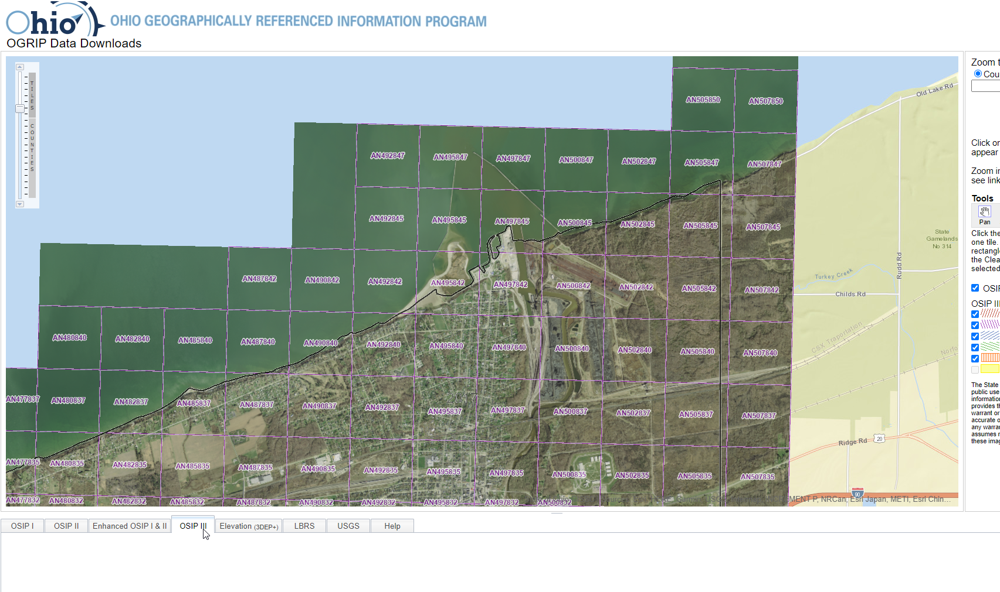

### Select the tile for the data you want to download (Other tabs at the bottom provide elevation / LiDAR Data)

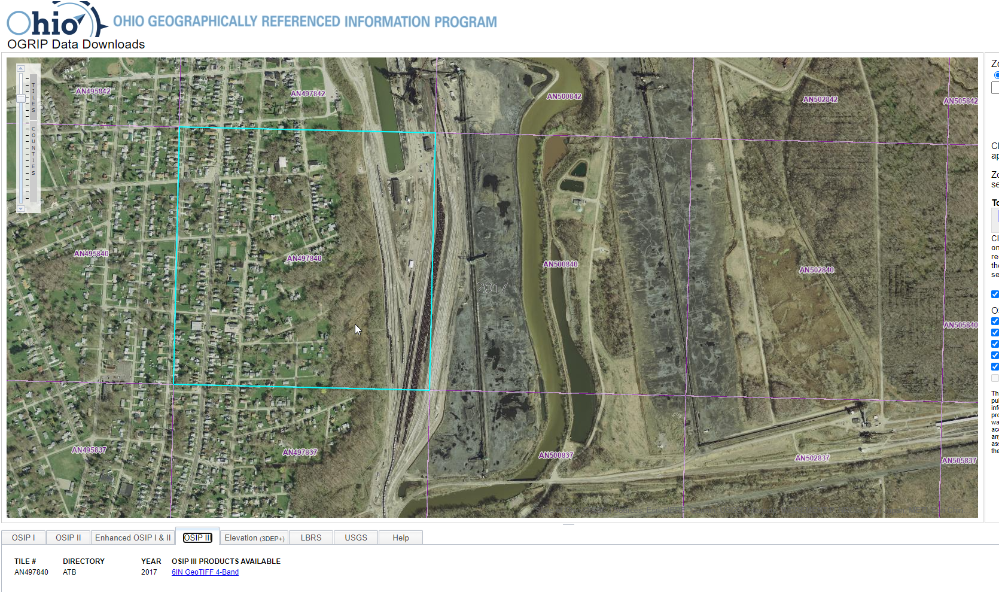

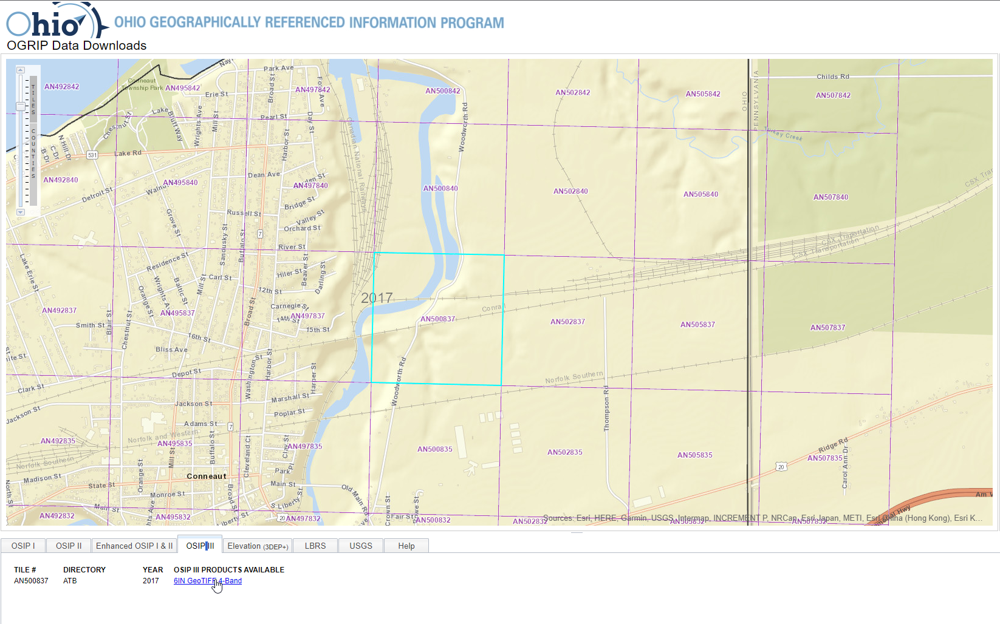

### Extract the files from the downloaded zip archive and reference them into microstation,

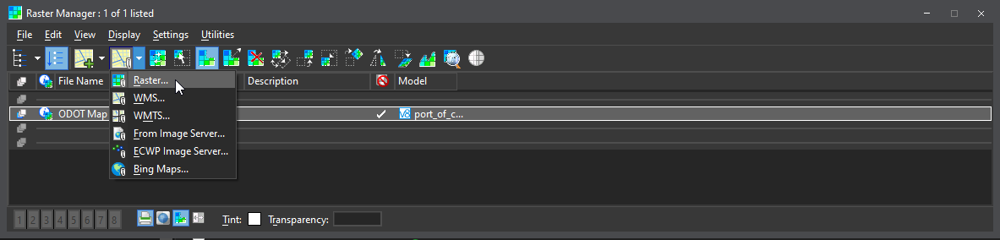

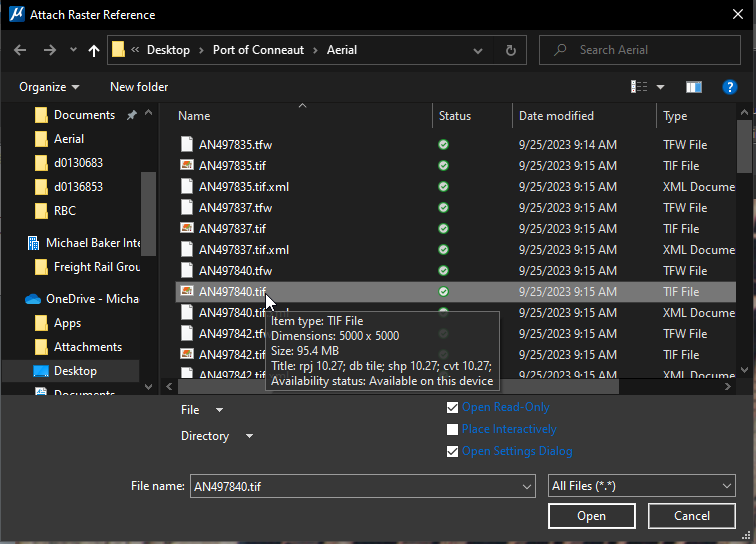

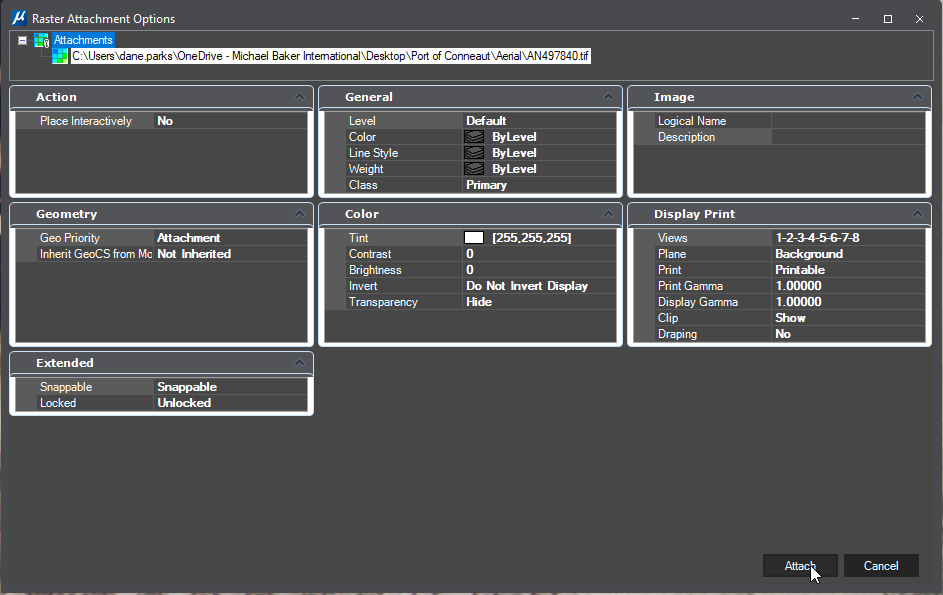

### Zooming Extents reveals the SID files are not correctly Georeferenced

The tiny white specs in the Top right and bottom left are the references

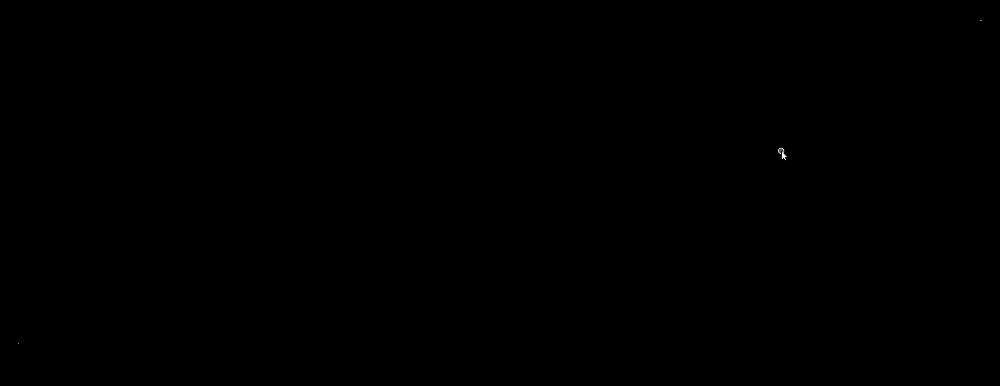


# Adding Lidar from same OGRIP Source

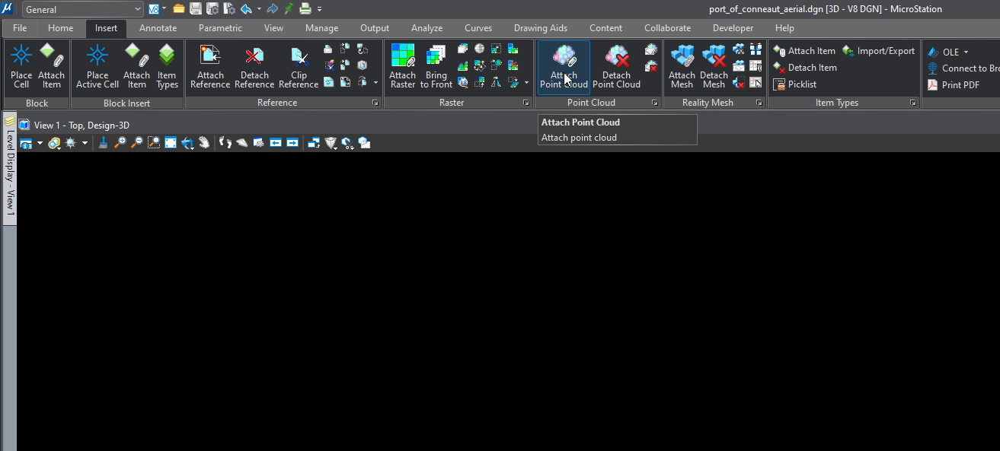

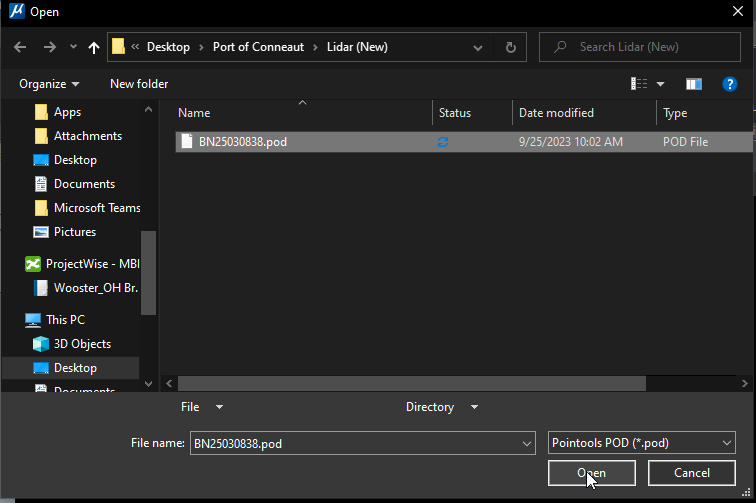

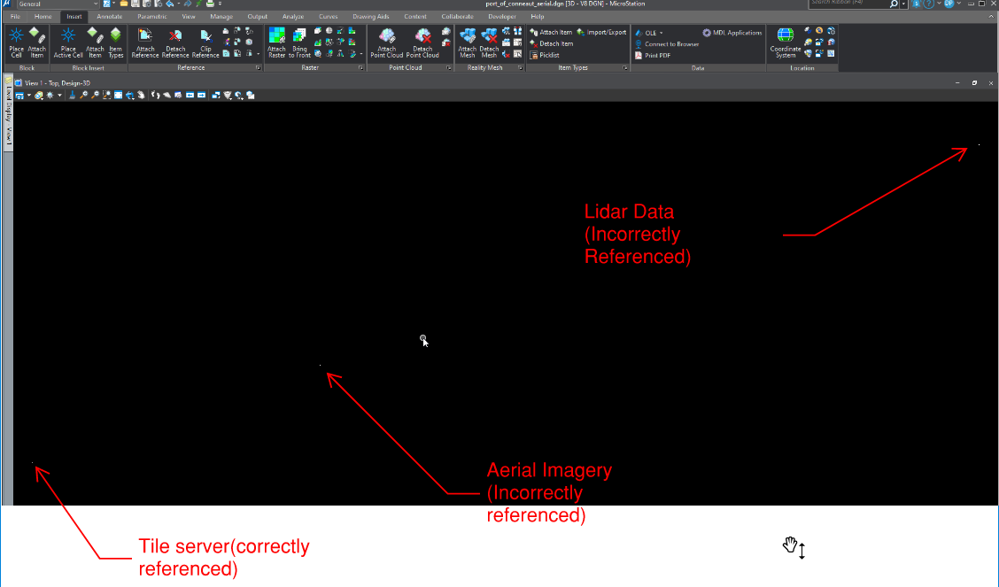

# Loading Imagery as Tile Server (Correctly Georeferenced)

[ODOT Data URL (All Tile Servers)](https://geo1.oit.ohio.gov/arcgis/rest/services)

[ODOT 6" tiles](https://geo1.oit.ohio.gov/arcgis/rest/services/OSIP/OSIP_2019_6in/ImageServer)

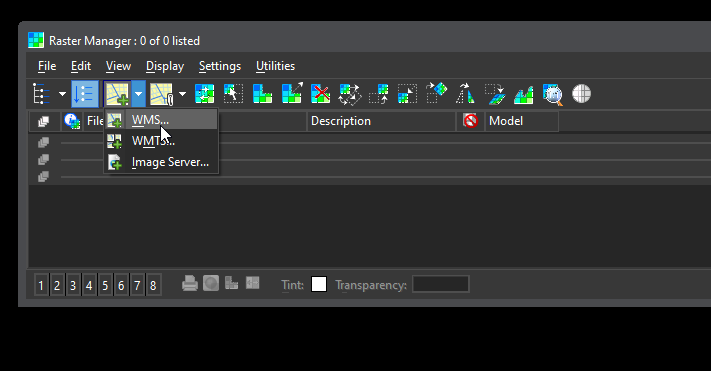

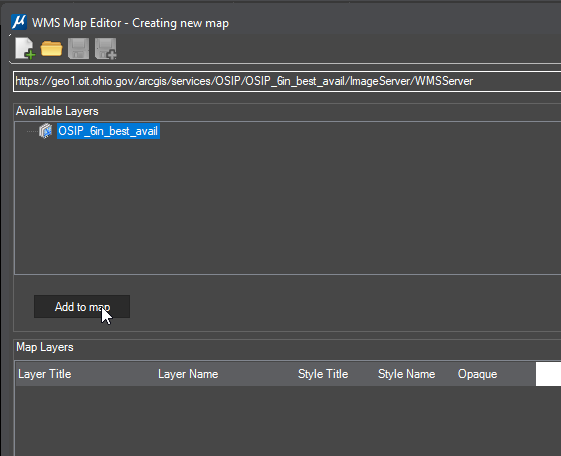

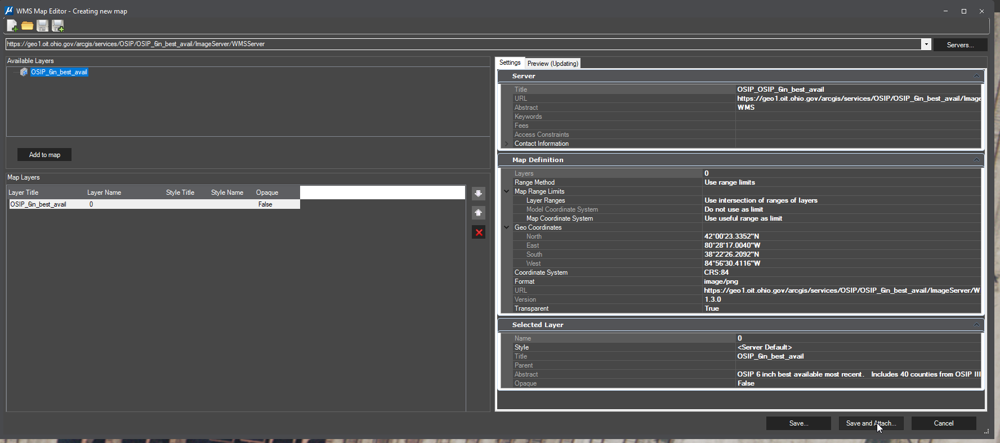

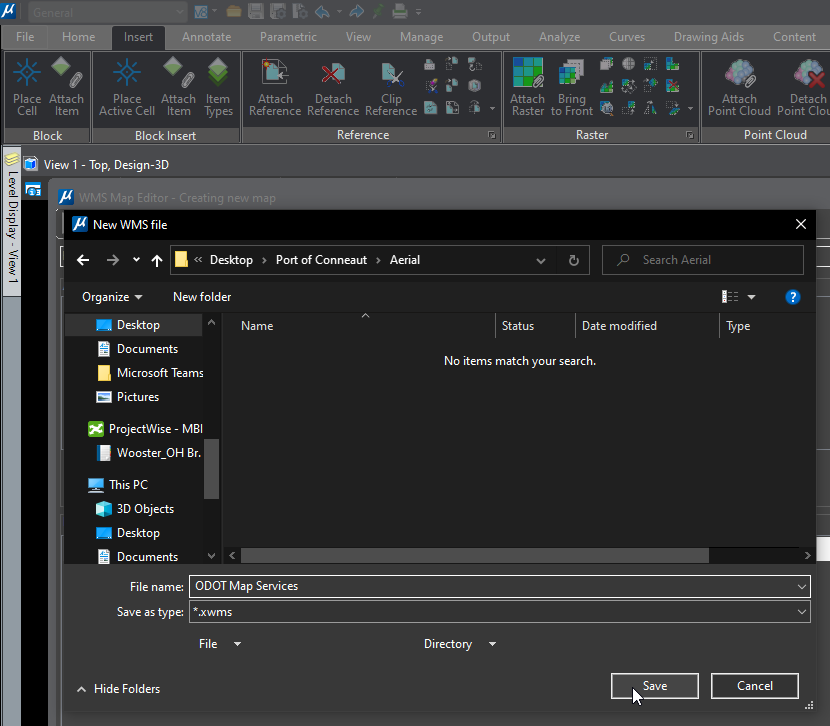

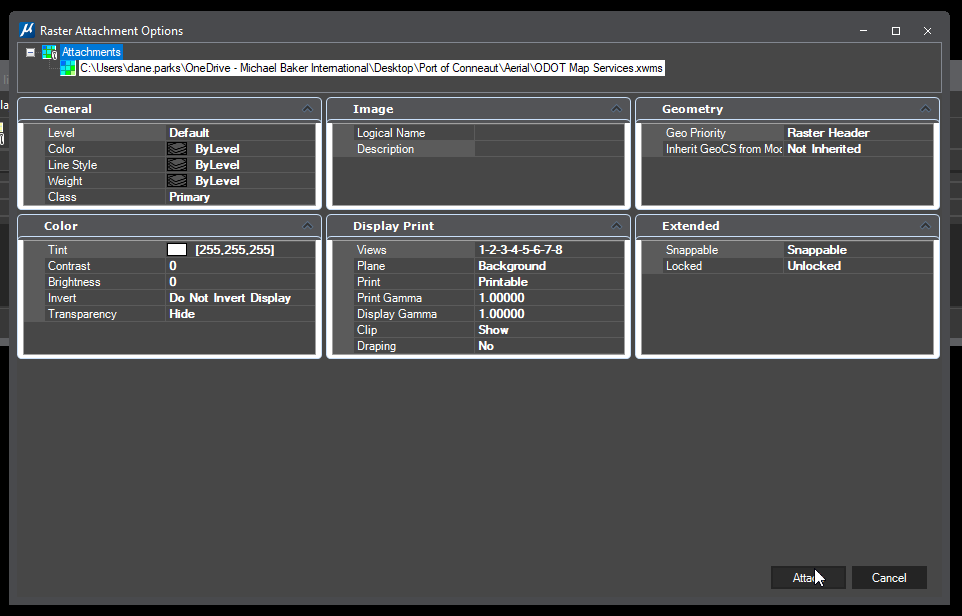

Wait like a minute, wiggle the mouse/view around a bit. (if the resolution seems slow, zoom in, wait for it it to catch up)

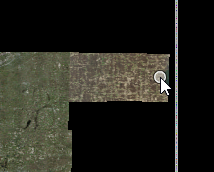

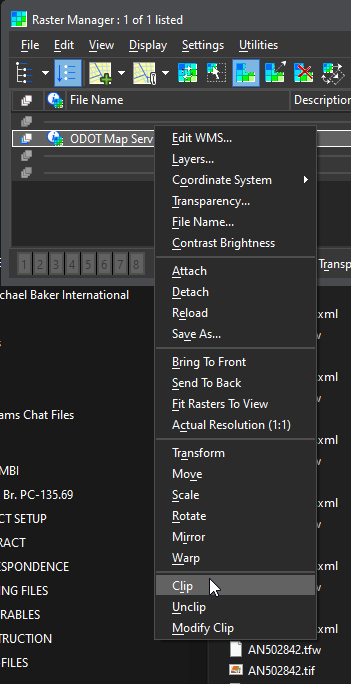

Clipping it makes Microstation much more responsive,

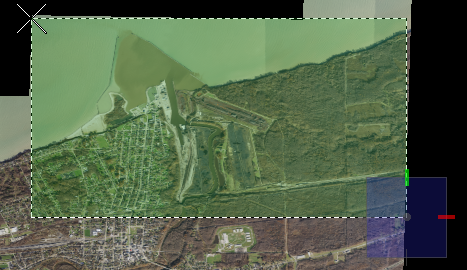

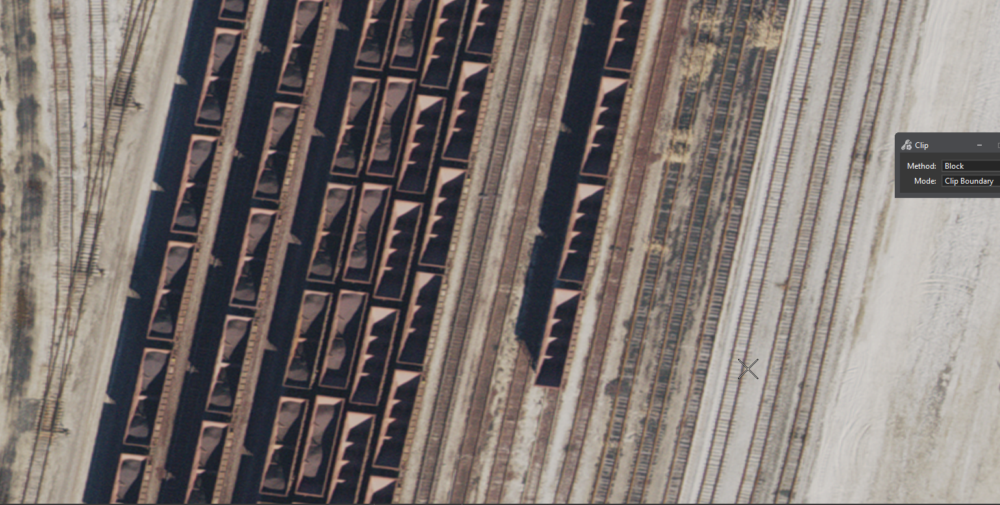

# Las File Conversion

In [ ]:
import laspy
import numpy as np

# Open the LAS file
las = laspy.read(r"L:\Projects\Users\dane.parks\NarrowPassage_RRBridge_USF.las")

# Extract the x, y, z coordinates
points = np.vstack((las.x, las.y, las.z)).transpose()

# Save to an XYZ file
np.savetxt(r"L:\Projects\Users\dane.parks\NarrowPassage_RRBridge_USF.xyz", points, fmt="%.3f", delimiter=" ")